In [20]:
# This Python 3 environment comes with many helpful analytics libraries installed
# It is defined by the kaggle/python Docker image: https://github.com/kaggle/docker-python
# For example, here's several helpful packages to load

import numpy as np # linear algebra
import pandas as pd # data processing, CSV file I/O (e.g. pd.read_csv)

# Input data files are available in the read-only "../input/" directory
# For example, running this (by clicking run or pressing Shift+Enter) will list all files under the input directory

import os
for dirname, _, filenames in os.walk('/kaggle/input'):
    for filename in filenames:
        print(os.path.join(dirname, filename))

# You can write up to 20GB to the current directory (/kaggle/working/) that gets preserved as output when you create a version using "Save & Run All" 
# You can also write temporary files to /kaggle/temp/, but they won't be saved outside of the current session

/kaggle/input/youtube-videos-and-the-comments/YT_Videos_Comments.csv


In [21]:
import pandas as pd
import numpy as np
import regex as re
import matplotlib.pyplot as plt
import string
from nltk.corpus import stopwords
from nltk.tokenize import word_tokenize
from nltk.stem import WordNetLemmatizer
from wordcloud import WordCloud
from sklearn.feature_extraction.text import TfidfVectorizer
from sklearn.decomposition import PCA
from sklearn import preprocessing
from scipy.spatial.distance import pdist, squareform
import scipy.cluster.hierarchy

In [22]:
df = pd.read_csv("/kaggle/input/youtube-videos-and-the-comments/YT_Videos_Comments.csv")

/tmp/ipykernel_30/1394498141.py:1: DtypeWarning: Columns (2,3,4,5,6,7,8) have mixed types. Specify dtype option on import or set low_memory=False.
  df = pd.read_csv("/kaggle/input/youtube-videos-and-the-comments/YT_Videos_Comments.csv")


In [23]:
df

,User,Video Title,Video Description,Video ID,Comment (Displayed),Comment (Actual),Comment Author,Comment Author Channel ID,Comment Time
0,Cleo Abram,"Robots made of spiders (yes, really)",I'M SORRY OK. But this is fascinating. \n\nSci...,YXd4z3gWyVE,zombie spider!! bomb the damn lab before it&#3...,zombie spider!! bomb the damn lab before it's ...,Bagus Hutomo,UC-F6GFyxAqGhN3_MEJLksxg,2023-03-11T07:39:33Z
1,Cleo Abram,"Robots made of spiders (yes, really)",I'M SORRY OK. But this is fascinating. \n\nSci...,YXd4z3gWyVE,"This is way less cool than it seems, spiders a...","This is way less cool than it seems, spiders a...",CMZ neu,UCZKnVEtNze-fFxCvsRnaIuA,2023-03-11T05:26:10Z
2,Cleo Abram,"Robots made of spiders (yes, really)",I'M SORRY OK. But this is fascinating. \n\nSci...,YXd4z3gWyVE,Spiders see this and this is why they made the...,Spiders see this and this is why they made the...,Kiana Marrie,UCutp6oeKAxsO6fXp1vyzvIQ,2023-03-11T04:02:27Z
3,Cleo Abram,"Robots made of spiders (yes, really)",I'M SORRY OK. But this is fascinating. \n\nSci...,YXd4z3gWyVE,you looks pretty 😍,you looks pretty 😍,Noob,UC9J99riIPd6ja-XDFSwrY-Q,2023-03-11T02:50:50Z
4,Cleo Abram,"Robots made of spiders (yes, really)",I'M SORRY OK. But this is fascinating. \n\nSci...,YXd4z3gWyVE,I can hear the hairs standing up on my wife’s ...,I can hear the hairs standing up on my wife’s ...,chancellor9000,UC8WEPXkCSh87h6kBcFT-o1g,2023-03-11T02:46:02Z
...,...,...,...,...,...,...,...,...,...
861957,Physics Girl,5 AMAZING stars we’ve discovered in space!,This episode is brought to you by Squarespace:...,xyXpQxz7BOs,"hey girl,make more vdos and make it lengthy .....","hey girl,make more vdos and make it lengthy .....",Omkar Bhambure,UCgY0dubqhFHVD6wWq37UCtg,2016-01-12T21:32:52Z
861958,Physics Girl,5 AMAZING stars we’ve discovered in space!,This episode is brought to you by Squarespace:...,xyXpQxz7BOs,Third,Third,Izzo Mapping,UCF0vKXNgNwO2iutasiiLoNQ,2016-01-12T21:30:37Z
861959,Physics Girl,5 AMAZING stars we’ve discovered in space!,This episode is brought to you by Squarespace:...,xyXpQxz7BOs,third,third,Indecisive,UChNeyv6tBcgrjfXJiy3xRFg,2016-01-12T21:30:34Z
861960,Physics Girl,5 AMAZING stars we’ve discovered in space!,This episode is brought to you by Squarespace:...,xyXpQxz7BOs,Second,Second,Nathan,UCkMeQzamGWna00H_sMQddvQ,2016-01-12T21:30:02Z


In [24]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 861962 entries, 0 to 861961
Data columns (total 9 columns):
 #   Column                     Non-Null Count   Dtype 
---  ------                     --------------   ----- 
 0   User                       861962 non-null  object
 1   Video Title                861813 non-null  object
 2   Video Description          665195 non-null  object
 3   Video ID                   432632 non-null  object
 4   Comment (Displayed)        394587 non-null  object
 5   Comment (Actual)           379081 non-null  object
 6   Comment Author             378994 non-null  object
 7   Comment Author Channel ID  379094 non-null  object
 8   Comment Time               379100 non-null  object
dtypes: object(9)
memory usage: 59.2+ MB


In [25]:
df = df.dropna()#dropping the rows with NaN values
df = df.sample(frac=1)#shuffling the dataset
df

,User,Video Title,Video Description,Video ID,Comment (Displayed),Comment (Actual),Comment Author,Comment Author Channel ID,Comment Time
161270,Physics Girl,99 Years Later... We Solved It,How do these rocks move on their own in the de...,JFFhD5HeByM,The sad thing is that there are now lots of tr...,The sad thing is that there are now lots of tr...,garzascreek,UCq9HUtbha9TW5INJlbNurVA,2022-04-06T07:00:27Z
813562,Physics Girl,WHICH TANK FILLS FIRST? ft. Simone Giertz,Dianna Cowern from Physics Girl and Simone Gie...,oxbuFwW5f-Q,"Hi, Physics girl. Wanted to do a collab with y...","Hi, Physics girl. Wanted to do a collab with y...",Vatshal Srivastav,UCa6HuogEjM_Kyxw7gFDHZLw,2017-11-18T23:04:15Z
459711,Physics Girl,Why This Stuff Costs $2700 Trillion Per Gram -...,Physics Girl is on Patreon! ►► https://www.pat...,PCuyCJocJWg,"This is dangerous work very risky and harmful,...","This is dangerous work very risky and harmful,...",Rezzo Kii,UCB7njAFXez7ueQ-8wLacnpQ,2019-11-19T12:03:54Z
201513,Physics Girl,We can see things moving faster than light,How is it possible for galaxies and objects in...,q67vH0SKahU,...,...,499seconds,UCDsoHojlI7JSBjJcBo4VJOA,2021-10-18T10:21:26Z
728424,Physics Girl,What is a Black Hole? - Stephen Hawking's fina...,~ The black hole information paradox and Soft ...,SdySHadrYAA,Omg where did u do schooling kid? Such false i...,Omg where did u do schooling kid? Such false i...,karthik krishna,UCr-f3yFK5eLmoPp5Pa1lI7w,2019-04-11T20:53:43Z
...,...,...,...,...,...,...,...,...,...
112169,Physics Girl,An Update On Dianna's Health,If you'd like to support Dianna during her rec...,vydgkCCXbTA,Wouldn&#39;t wish vax damage on anyone.,Wouldn't wish vax damage on anyone.,LozMorganFilms,UCZ1gB5jyXTCtFqBaFTcfRGw,2023-03-10T13:58:14Z
56853,neo,The Genius Design of Apple Park,Watch my new video about Las Vegas on Nebula:\...,VbeM8Lf7s5A,Nice video. Thx for the knowledge.,Nice video. Thx for the knowledge.,Horry Pottur,UC_xrTIRtmlABhcxtHdD32eA,2023-02-12T10:58:24Z
743537,Physics Girl,Can You Solve this Ice Diamond Riddle? ft. Vsa...,Michael’s Math Magic Video: https://www.youtub...,kiifM9APMNQ,Water level goes slightly up.,Water level goes slightly up.,Haggle Forth,UCuSuAcqH6leMr7u1iMhpSTg,2018-07-06T08:18:45Z
29145,Jet Lag: The Game,We Turned New Zealand Into a Real-Life Board Game,Watch the next episode of Jet Lag right now on...,LxLgmsmvXOE,"<a href=""http://www.youtube.com/results?search...",#SucksToBeThem,Douglas Boyle,UCQAaWHGAm-L_ZT3sHmUdWfQ,2023-03-09T12:33:19Z


In [26]:
stops = set(stopwords.words("english"))
stops

{'a',
 'about',
 'above',
 'after',
 'again',
 'against',
 'ain',
 'all',
 'am',
 'an',
 'and',
 'any',
 'are',
 'aren',
 "aren't",
 'as',
 'at',
 'be',
 'because',
 'been',
 'before',
 'being',
 'below',
 'between',
 'both',
 'but',
 'by',
 'can',
 'couldn',
 "couldn't",
 'd',
 'did',
 'didn',
 "didn't",
 'do',
 'does',
 'doesn',
 "doesn't",
 'doing',
 'don',
 "don't",
 'down',
 'during',
 'each',
 'few',
 'for',
 'from',
 'further',
 'had',
 'hadn',
 "hadn't",
 'has',
 'hasn',
 "hasn't",
 'have',
 'haven',
 "haven't",
 'having',
 'he',
 'her',
 'here',
 'hers',
 'herself',
 'him',
 'himself',
 'his',
 'how',
 'i',
 'if',
 'in',
 'into',
 'is',
 'isn',
 "isn't",
 'it',
 "it's",
 'its',
 'itself',
 'just',
 'll',
 'm',
 'ma',
 'me',
 'mightn',
 "mightn't",
 'more',
 'most',
 'mustn',
 "mustn't",
 'my',
 'myself',
 'needn',
 "needn't",
 'no',
 'nor',
 'not',
 'now',
 'o',
 'of',
 'off',
 'on',
 'once',
 'only',
 'or',
 'other',
 'our',
 'ours',
 'ourselves',
 'out',
 'over',
 'own',
 'r

In [28]:
def cleanhtml(sentence): #function to clean the word of any html-tags
    cleanr = re.compile('<.*?>')
    cleantext = re.sub(cleanr, ' ', sentence)
    return cleantext
def cleanpunc(sentence): #function to clean the word of any punctuation or special characters
    cleaned = re.sub(r'[?|!|\'|"|#]',r'',sentence)
    cleaned = re.sub(r'[.|,|)|(|\|/]',r' ',cleaned)
    return  cleaned

In [29]:
# Creating a List of comments separated into words after cleaning the text
i=0
list_of_sent_train=[]
for sent in df['Comment (Actual)']:
    filtered_sentence=[]
    sent=str(sent)
    sent=cleanhtml(sent)
    for w in sent.split():
        for cleaned_words in cleanpunc(w).split():
            if(cleaned_words.isalpha()):    
                filtered_sentence.append(cleaned_words.lower())
            else:
                continue 
    list_of_sent_train.append(filtered_sentence)

In [30]:
len(list_of_sent_train)

378973

In [31]:
import gensim
# Training the wor2vec model using train dataset
w2v_model=gensim.models.Word2Vec(list_of_sent_train, workers=4)

In [32]:
import numpy as np
sent_vectors = []; # the avg-w2v for each sentence/review is stored in this train
for sent in list_of_sent_train: # for each review/sentence
    sent_vec = np.zeros(100) # as word vectors are of zero length
    cnt_words =0; # num of words with a valid vector in the sentence/review
    for word in sent: # for each word in a review/sentence
        try:
            vec = w2v_model.wv[word]
            sent_vec += vec
            cnt_words += 1
        except:
            pass
    sent_vec /= cnt_words
    sent_vectors.append(sent_vec)
sent_vectors = np.array(sent_vectors)
sent_vectors = np.nan_to_num(sent_vectors)
sent_vectors.shape

/tmp/ipykernel_30/2068892558.py:13: RuntimeWarning: invalid value encountered in divide
  sent_vec /= cnt_words


(378973, 100)

In [33]:
#Reducing the vectorised array to 1 dimension
pca1 = PCA(n_components = 1)
sent_vectors = pca1.fit_transform(sent_vectors)

In [35]:
#Creating a new dataframe out of original one
df2 = df.filter(['User', 'Video Title', 'Comment Author'], axis=1)
df2

,User,Video Title,Comment Author
161270,Physics Girl,99 Years Later... We Solved It,garzascreek
813562,Physics Girl,WHICH TANK FILLS FIRST? ft. Simone Giertz,Vatshal Srivastav
459711,Physics Girl,Why This Stuff Costs $2700 Trillion Per Gram -...,Rezzo Kii
201513,Physics Girl,We can see things moving faster than light,499seconds
728424,Physics Girl,What is a Black Hole? - Stephen Hawking's fina...,karthik krishna
...,...,...,...
112169,Physics Girl,An Update On Dianna's Health,LozMorganFilms
56853,neo,The Genius Design of Apple Park,Horry Pottur
743537,Physics Girl,Can You Solve this Ice Diamond Riddle? ft. Vsa...,Haggle Forth
29145,Jet Lag: The Game,We Turned New Zealand Into a Real-Life Board Game,Douglas Boyle


In [36]:
#Converting numpy array into a list
sent_vectors_new = []
for sent_vector in sent_vectors:
    sent_vector = sent_vector[0]
    sent_vectors_new.append(sent_vector)

In [37]:
df2['Comment (Actual)'] = sent_vectors_new
df2

,User,Video Title,Comment Author,Comment (Actual)
161270,Physics Girl,99 Years Later... We Solved It,garzascreek,-1.125436
813562,Physics Girl,WHICH TANK FILLS FIRST? ft. Simone Giertz,Vatshal Srivastav,1.476480
459711,Physics Girl,Why This Stuff Costs $2700 Trillion Per Gram -...,Rezzo Kii,-0.693250
201513,Physics Girl,We can see things moving faster than light,499seconds,0.607259
728424,Physics Girl,What is a Black Hole? - Stephen Hawking's fina...,karthik krishna,-0.599959
...,...,...,...,...
112169,Physics Girl,An Update On Dianna's Health,LozMorganFilms,0.407534
56853,neo,The Genius Design of Apple Park,Horry Pottur,2.665674
743537,Physics Girl,Can You Solve this Ice Diamond Riddle? ft. Vsa...,Haggle Forth,-2.520400
29145,Jet Lag: The Game,We Turned New Zealand Into a Real-Life Board Game,Douglas Boyle,0.607259


In [38]:
#Performing label encoding on the categorical variables
label_encoder = preprocessing.LabelEncoder()
df2['User']= label_encoder.fit_transform(df['User'])
df2['Video Title']= label_encoder.fit_transform(df['Video Title'])
df2['Comment Author']= label_encoder.fit_transform(df['Comment Author'])
df2

,User,Video Title,Comment Author,Comment (Actual)
161270,2,11,216416,-1.125436
813562,2,224,193492,1.476480
459711,2,275,154307,-0.693250
201513,2,237,1404,0.607259
728424,2,252,222580,-0.599959
...,...,...,...,...
112169,2,14,111489,0.407534
56853,3,188,77243,2.665674
743537,2,26,73472,-2.520400
29145,1,235,52599,0.607259


In [39]:
#Creating the Kmeans clustering model
from sklearn.cluster import KMeans
model2 = KMeans(n_clusters = 2, n_init=10)
model2.fit(df2)

KMeans(n_clusters=2, n_init=10)

In [40]:
word_cluster_pred=model2.predict(df2)
word_cluster_pred_2=model2.labels_
word_cluster_center=model2.cluster_centers_

In [41]:
model2.labels_

array([0, 0, 0, ..., 1, 1, 1], dtype=int32)

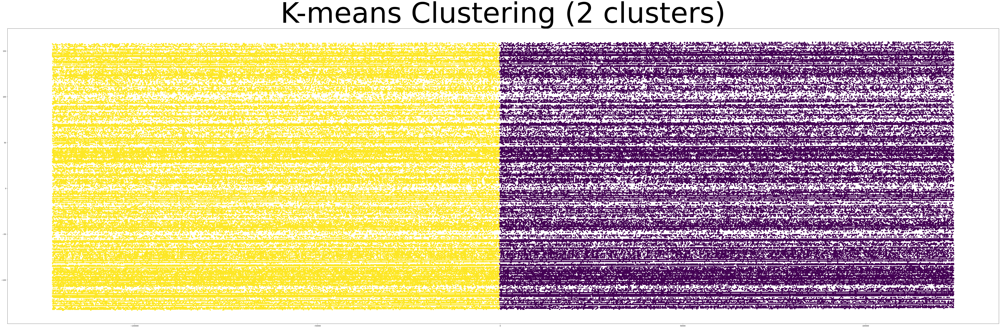

In [42]:
#Visualising the clusters
pca = PCA(n_components=2)
X_pca = pca.fit_transform(df2)
plt.figure(figsize=(100,30))
plt.scatter(X_pca[:, 0], X_pca[:, 1], c=model2.labels_)
plt.title('K-means Clustering (2 clusters)', fontsize=160)
plt.show()

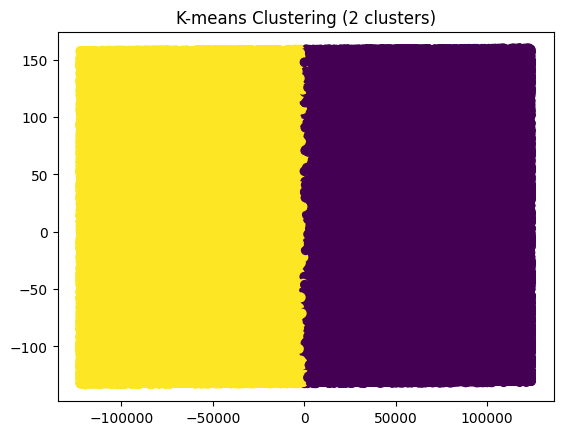

In [43]:
pca = PCA(n_components=2)
X_pca = pca.fit_transform(df2)
plt.scatter(X_pca[:, 0], X_pca[:, 1], c=model2.labels_)
plt.title('K-means Clustering (2 clusters)')
plt.show()

Performing Hierchical Clustering on a sample of 1000 points from the dataset.

In [46]:
list_of_sent = []
for sent in df['Comment (Actual)']:
    sent = str(sent)
    list_of_sent.append(sent.split())


In [47]:
i=0
list_of_sent_train=[]
for i in range(1000):
    sent = list_of_sent[i]
    filtered_sentence=[]
    sent=str(sent)
    sent=cleanhtml(sent)
    for w in sent.split():
        for cleaned_words in cleanpunc(w).split():
            if(cleaned_words.isalpha()):    
                filtered_sentence.append(cleaned_words.lower())
            else:
                continue 
    list_of_sent_train.append(filtered_sentence)

In [48]:
import gensim
# Training the wor2vec model using train dataset
w2v_model=gensim.models.Word2Vec(list_of_sent_train, workers=4)

In [49]:
import numpy as np
sent_vectors = []; # the avg-w2v for each sentence/review is stored in this train
for sent in list_of_sent_train: # for each review/sentence
    sent_vec = np.zeros(100) # as word vectors are of zero length
    cnt_words =0; # num of words with a valid vector in the sentence/review
    for word in sent: # for each word in a review/sentence
        try:
            vec = w2v_model.wv[word]
            sent_vec += vec
            cnt_words += 1
        except:
            pass
    sent_vec /= cnt_words
    sent_vectors.append(sent_vec)
sent_vectors = np.array(sent_vectors)
sent_vectors = np.nan_to_num(sent_vectors)
sent_vectors.shape

/tmp/ipykernel_30/2068892558.py:13: RuntimeWarning: invalid value encountered in divide
  sent_vec /= cnt_words


(1000, 100)

In [50]:
pca2 = PCA(n_components = 2)
sent_vectors_2d = pca2.fit_transform(sent_vectors)

/tmp/ipykernel_30/1855291426.py:10: ClusterWarning: The symmetric non-negative hollow observation matrix looks suspiciously like an uncondensed distance matrix
  linkage_matrix = linkage(dist_matrix, method='ward')


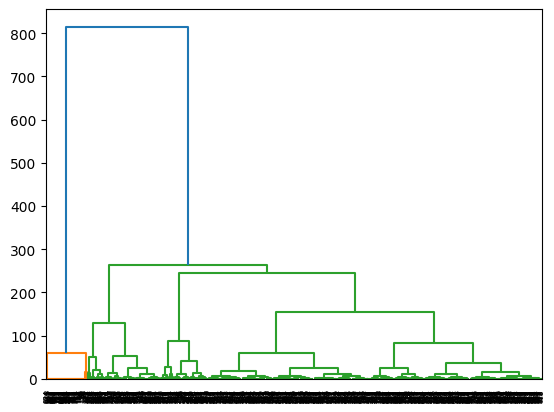

In [51]:
from sklearn.cluster import AgglomerativeClustering
# Compute the distance matrix
dist_matrix = squareform(pdist(sent_vectors_2d, metric='euclidean'))

# Perform hierarchical clustering
clustering = AgglomerativeClustering(n_clusters=2, linkage='ward').fit(sent_vectors_2d)

# Plot the dendrogram
from scipy.cluster.hierarchy import dendrogram, linkage
linkage_matrix = linkage(dist_matrix, method='ward')
dendrogram(linkage_matrix)

# Assign data points to clusters
labels = clustering.labels_

In [52]:
print(labels)

[0 0 0 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 1 0 0 0 0 0 1 0 0 0 0 0 0 0 0 0 0
 0 0 0 0 0 1 0 0 0 0 0 0 0 0 0 1 0 0 0 0 1 0 0 0 0 0 0 1 0 0 0 0 0 0 0 0 0
 0 0 1 0 0 0 0 0 0 0 0 0 1 0 0 0 0 0 0 0 0 1 0 0 0 0 0 1 0 0 0 0 0 0 0 0 0
 0 0 0 0 0 1 0 0 0 1 0 0 1 0 0 0 0 1 0 0 0 0 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0
 0 0 0 0 1 0 0 0 0 0 0 0 0 0 0 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
 0 0 0 0 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
 0 0 1 0 0 0 0 0 0 0 0 0 0 0 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 1 0 0 0 0 0
 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
 0 0 0 0 0 0 0 0 0 0 0 0 0 0 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 1 0
 0 0 0 0 0 0 0 0 0 0 1 0 0 0 0 1 0 1 0 0 0 0 1 0 1 0 0 0 0 0 0 0 0 0 0 0 0
 0 0 1 0 0 0 0 0 0 0 0 0 0 0 0 0 1 0 0 0 0 0 0 0 0 0 0 1 0 0 1 0 0 0 0 0 0
 0 0 0 0 0 0 0 0 0 0 0 0 0 0 1 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
 0 0 0 0 0 1 0 0 0 0 0 0 